# Finding RNAfish spots in 256x256 images using Unet, Conv2d

In [8]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from scipy.optimize import curve_fit
from PIL import Image
import random
import utils

In [9]:
data='/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/'

# Get data

Load data from file

In [18]:
shp=[1,512,512,3]

In [19]:
both=utils.get_raw_float_image(data+'Training.tif_RotShift.raw',shp)


FileNotFoundError: [Errno 2] No such file or directory: '/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/Training.tif_RotShift.raw'

In [5]:
train_data=both[:,:,:,[0]]/655350.0
train_truth=both[:,:,:,[1,2]]

mean=np.mean(train_data)
std=np.std(train_data)


train_data=(train_data-mean)/(std*1)+0.5
train_truth[np.where(train_truth>0.1)]=1

validation=utils.get_raw_float_image(data+'Validation.raw',shp)

validation_data=validation[:,:,:,[0]]/655350.0
validation_data=(validation_data-mean)/(std*1)+0.5

validation_truth=validation[:,:,:,[1,2]]
validation_truth[np.where(validation_truth>0.1)]=1


In [6]:
print([mean, std])

[0.5779962, 0.13802522]


In [7]:
np.median(train_truth[0,:,:,0])

0.0

# Design network

Define a function to create a convolutional layer, including conv, relu, maxpool, that can be called multiple times

In [11]:
tf.reset_default_graph()
#Input and output
x=tf.placeholder(dtype=tf.float32, shape=[None, 512,512,1], name='x')
y=tf.placeholder(dtype=tf.float32, shape=[None, 512,512,2], name='y')
lr=tf.placeholder(dtype=tf.float32, shape=[], name='learning_rate')
dr=tf.placeholder(dtype=tf.float32, shape=[], name='dropout_rate')

regularizer = tf.contrib.layers.l2_regularizer(scale=0.1)

xr=x
yr=y

base_scaler=32

#Going down
A1=utils.leaky_relu(tf.layers.conv2d(xr, base_scaler, [5,5], padding='SAME', kernel_regularizer=regularizer))
A2=utils.leaky_relu(tf.layers.conv2d(A1, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

B0=tf.nn.max_pool(A2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
B1=utils.leaky_relu(tf.layers.conv2d(B0, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
B2=utils.leaky_relu(tf.layers.conv2d(B1, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

C0=tf.nn.max_pool(B2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
C1=utils.leaky_relu(tf.layers.conv2d(C0, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
C2=utils.leaky_relu(tf.layers.conv2d(C1, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

D0=tf.nn.max_pool(C2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
D1=utils.leaky_relu(tf.layers.conv2d(D0, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
D2=utils.leaky_relu(tf.layers.conv2d(D1, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

E0=tf.nn.max_pool(D2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
E1=utils.leaky_relu(tf.layers.conv2d(E0, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
E2=utils.leaky_relu(tf.layers.conv2d(E1, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

#Coming up
DD0=tf.layers.conv2d_transpose(E2, 8*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
DD1=tf.concat(axis=3, values=[DD0,D2])
DD2=utils.leaky_relu(tf.layers.conv2d(DD1, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
DD3=utils.leaky_relu(tf.layers.conv2d(DD2, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

CC0=tf.layers.conv2d_transpose(DD3, 4*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
CC1=tf.concat(axis=3, values=[CC0,C2])
CC2=utils.leaky_relu(tf.layers.conv2d(CC1, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
CC3=utils.leaky_relu(tf.layers.conv2d(CC2, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

BB0=tf.layers.conv2d_transpose(CC3, 2*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#BB0=tf.contrib.layers.conv2d_transpose(C2, 2*base_scaler, kernel_size=[3,3], stride=[2, 2], padding='SAME')
BB1=tf.concat(axis=3, values=[BB0,B2])
BB2=utils.leaky_relu(tf.layers.conv2d(BB1, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
BB3=utils.leaky_relu(tf.layers.conv2d(BB2, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

AA0=tf.layers.conv2d_transpose(BB3, base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
AA1=tf.concat(axis=3, values=[AA0,A2])
AA2=utils.leaky_relu(tf.layers.conv2d(AA1, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
AA3=utils.leaky_relu(tf.layers.conv2d(AA2, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

logits=utils.leaky_relu(tf.layers.conv2d(AA3, 2, [1,1], padding='SAME', kernel_regularizer=regularizer))
probs=tf.tanh(logits, name='probabilities')

diff=tf.subtract(probs, yr)
LSQ=tf.multiply(diff,diff)
#Added this to make the outlines more potent in error function
OutError, MaskError=tf.split(LSQ, [1,1], 3)
loss=1*tf.reduce_mean(OutError)+0.1*tf.reduce_mean(MaskError)
loss=tf.reduce_mean(LSQ, name='error')
l2_loss = tf.losses.get_regularization_loss()
#loss=loss+l2_loss/1000

train_op=tf.train.AdamOptimizer(learning_rate=lr, name='trainer').minimize(loss)

tf.summary.scalar('loss', loss)
#tf.summary.image('input', x, 4)
#tf.summary.image('standard', y, 4)
#tf.summary.image('processed', probs, 4)


merge = tf.summary.merge_all()

# Training on easy set

0
Training loss:  0.05569645
(3, 512, 512, 2)
Validation loss:  0.03357822


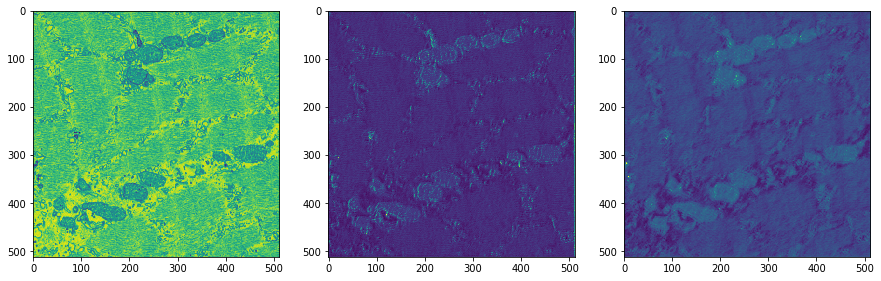

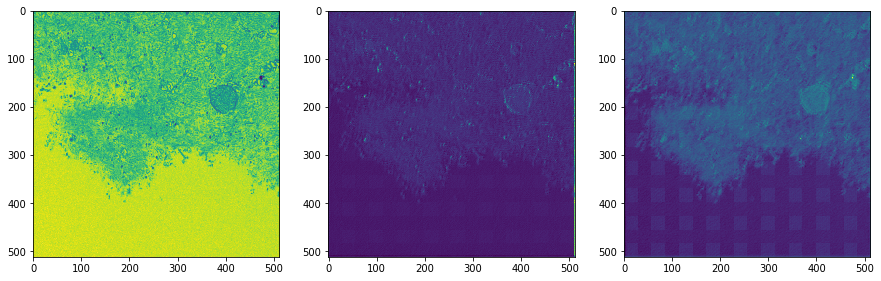

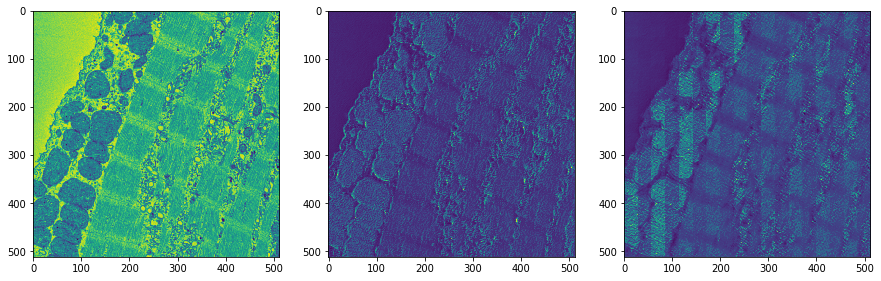

100
Training loss:  0.03951506
(3, 512, 512, 2)
Validation loss:  0.027622832


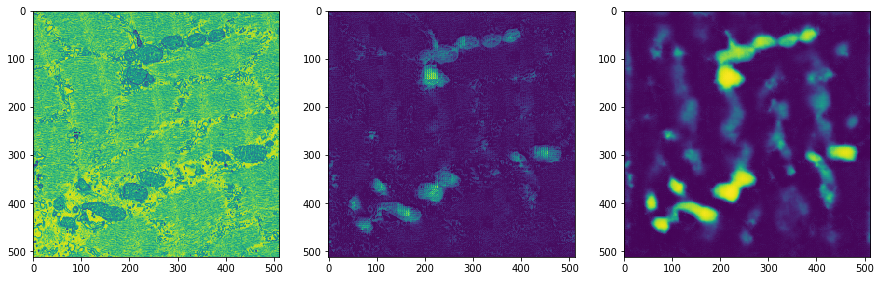

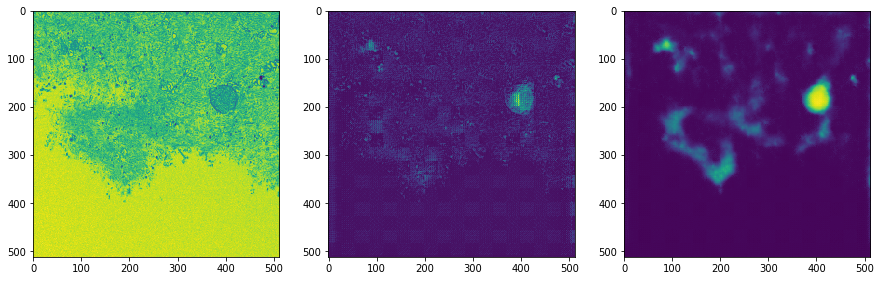

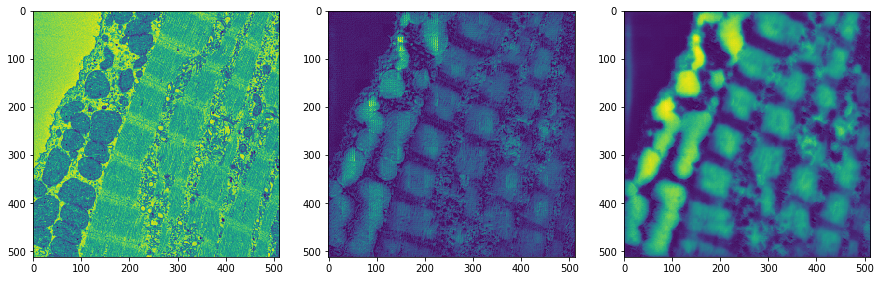

200
Training loss:  0.025344599
(3, 512, 512, 2)
Validation loss:  0.013908415


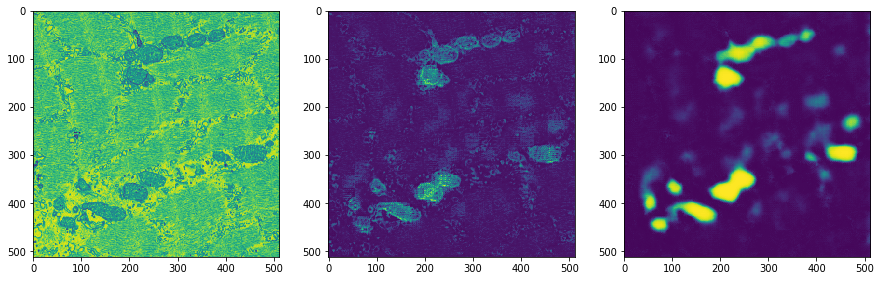

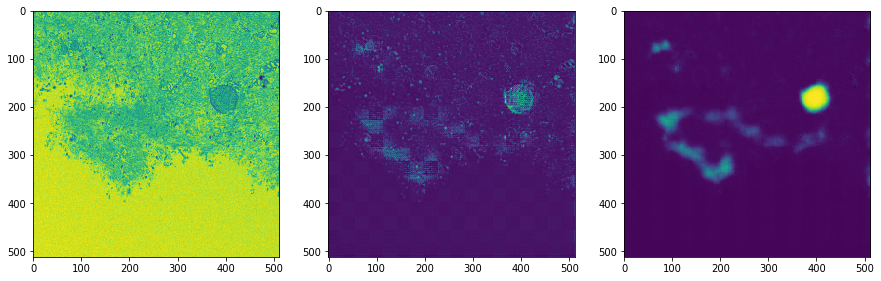

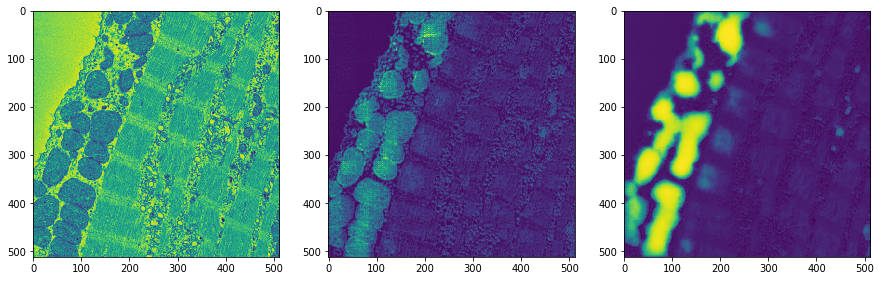

300
Training loss:  0.021825481
(3, 512, 512, 2)
Validation loss:  0.012883029


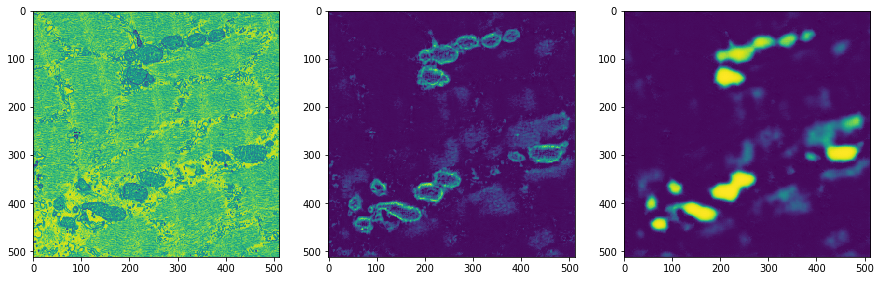

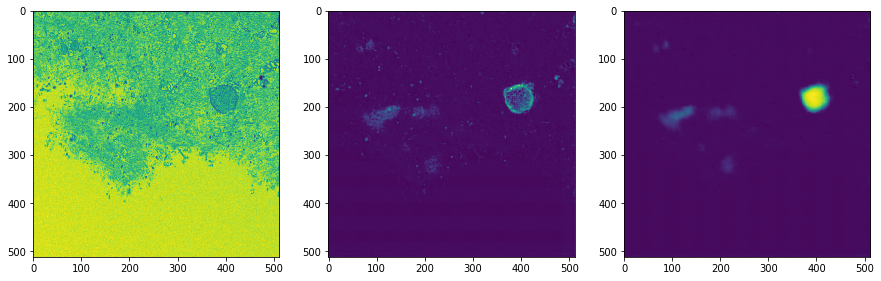

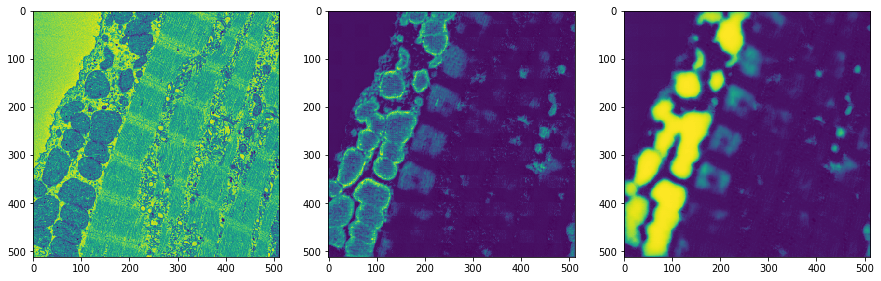

400
Training loss:  0.017677506
(3, 512, 512, 2)
Validation loss:  0.014016081


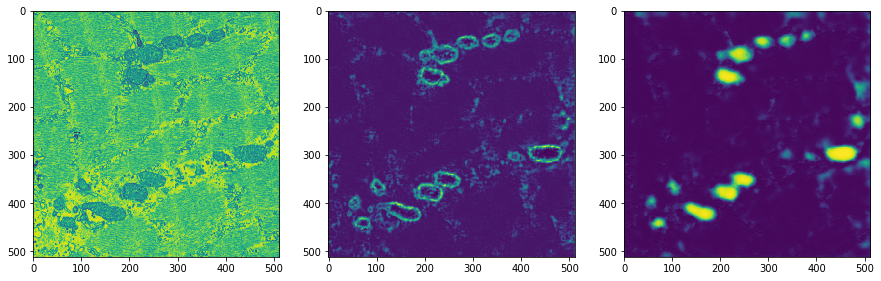

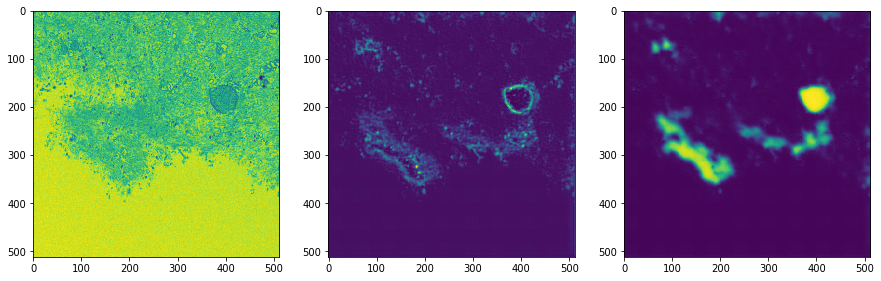

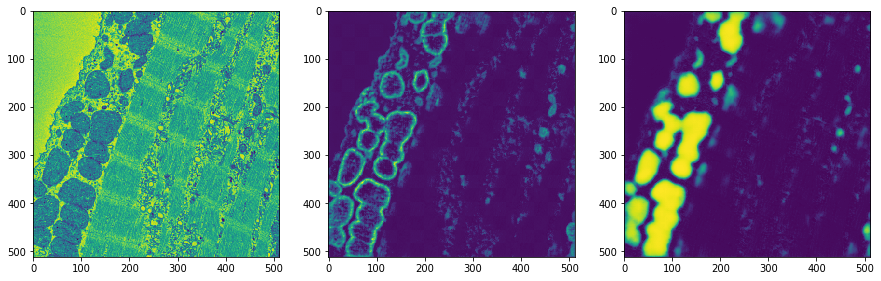

500
Training loss:  0.014041857
(3, 512, 512, 2)
Validation loss:  0.009008744


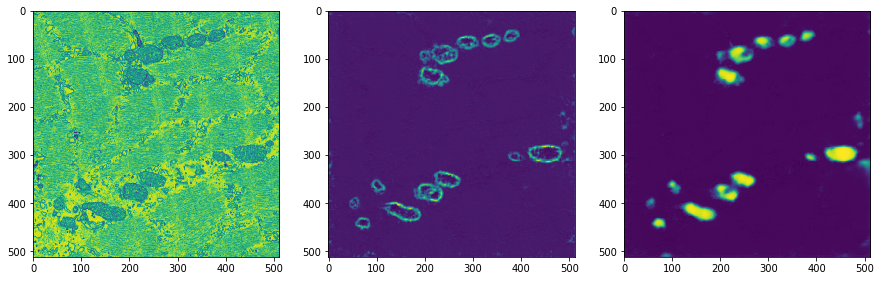

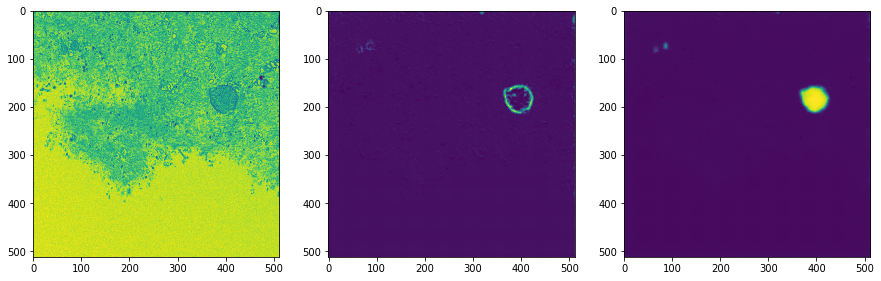

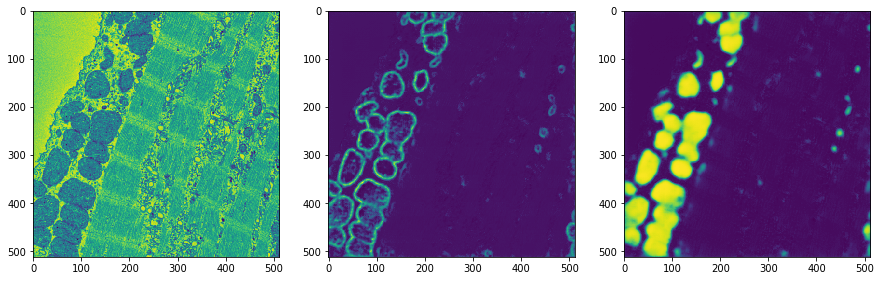

600
Training loss:  0.013803177
(3, 512, 512, 2)
Validation loss:  0.008598605


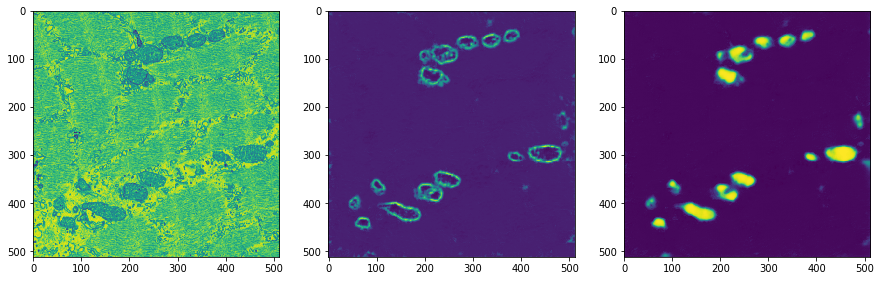

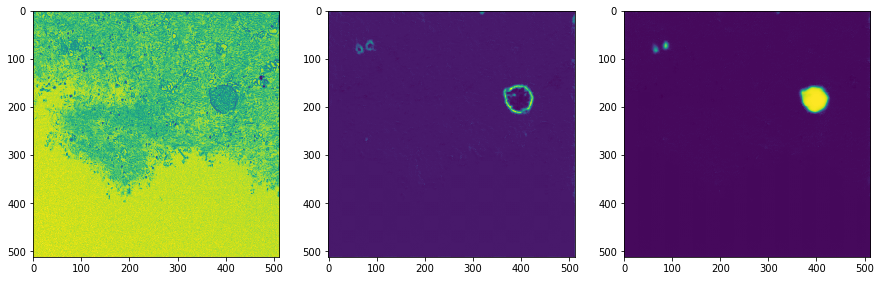

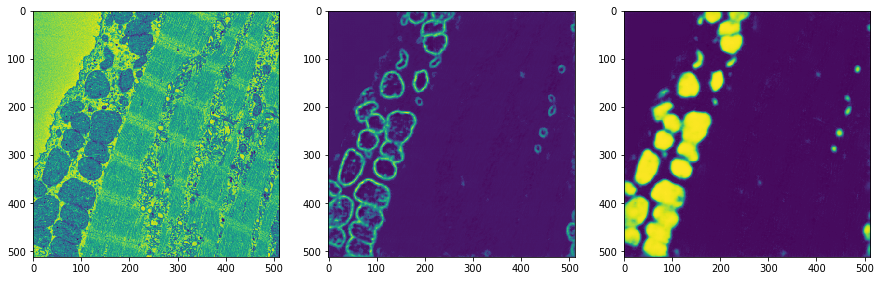

700
Training loss:  0.01438968
(3, 512, 512, 2)
Validation loss:  0.008032964


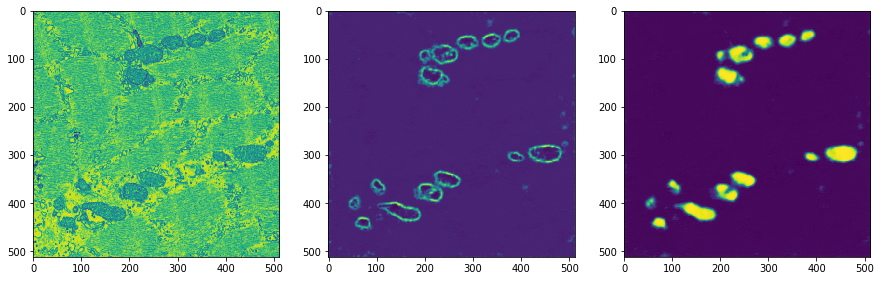

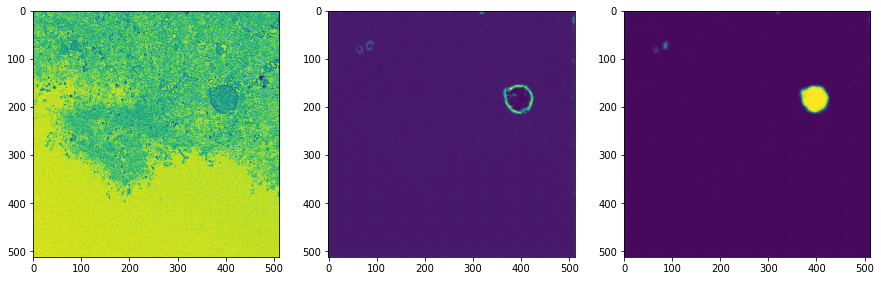

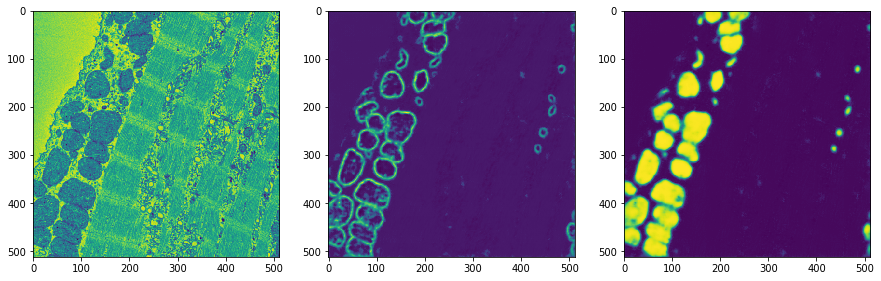

800
Training loss:  0.011267313
(3, 512, 512, 2)
Validation loss:  0.007865936


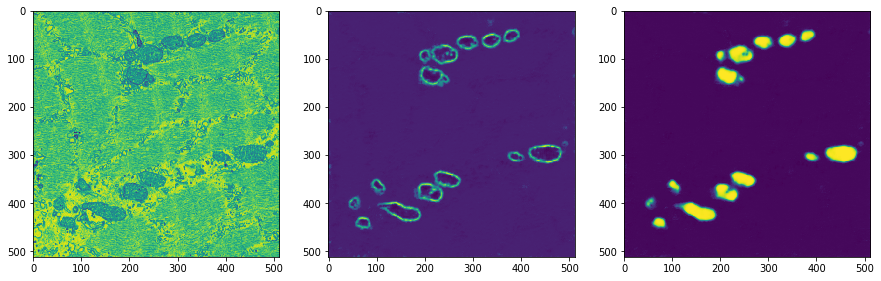

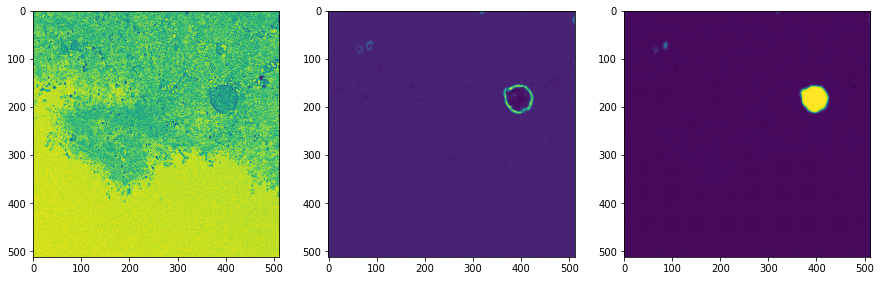

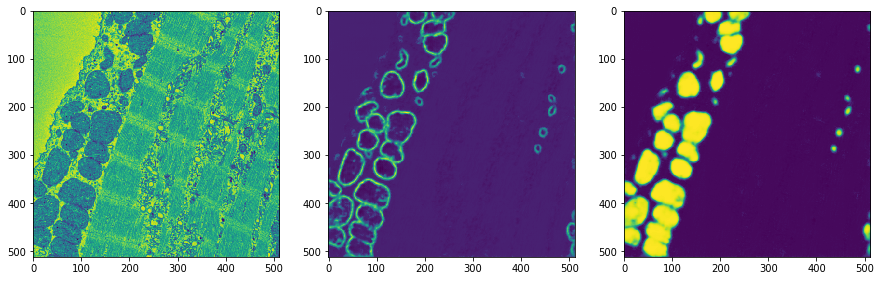

900
Training loss:  0.009689196
(3, 512, 512, 2)
Validation loss:  0.007707007


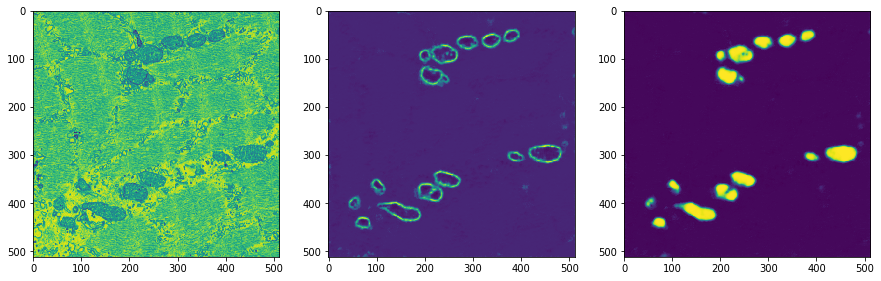

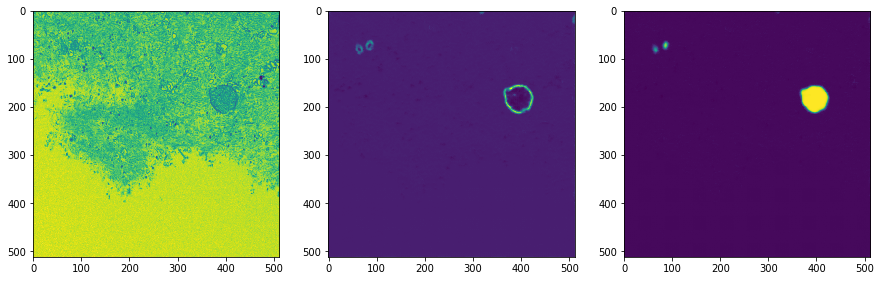

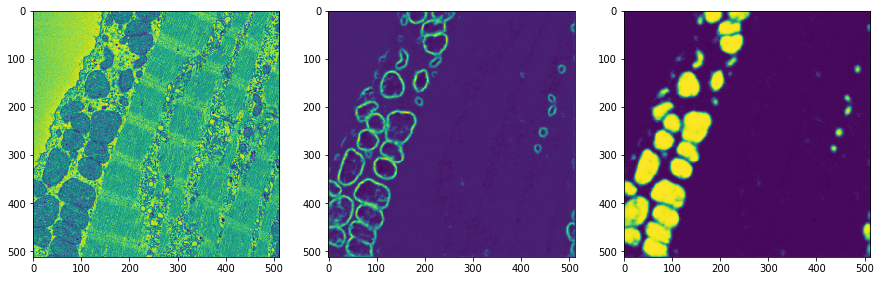

1000
Training loss:  0.013373647
(3, 512, 512, 2)
Validation loss:  0.007829667


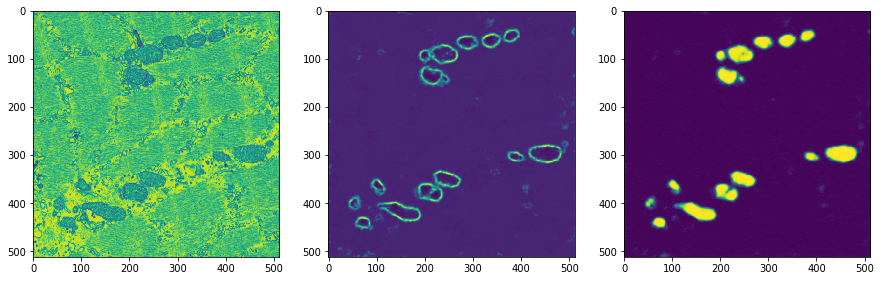

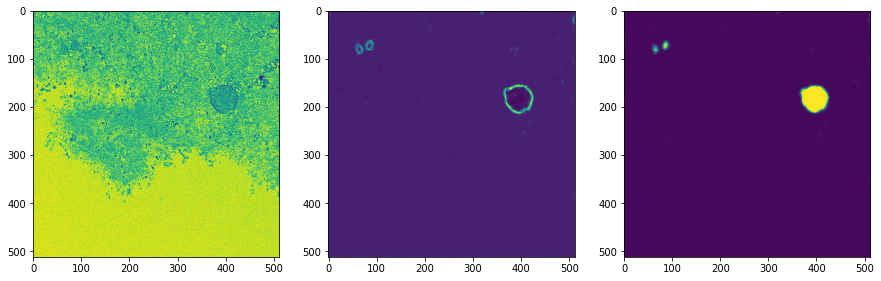

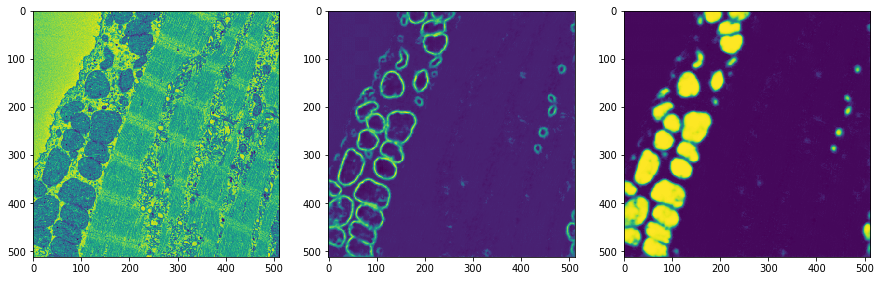

KeyboardInterrupt: 

In [13]:
tf.set_random_seed(123456)
sess=tf.Session()
sess.run(tf.global_variables_initializer())
saver = tf.train.Saver(max_to_keep=50)
#train_writer = tf.summary.FileWriter('./logs/1/train ', sess.graph)
test_writer = tf.summary.FileWriter('./logs/152/test ')


learning_rates=[0.000195, 0.0001, 0.00002, 0.00001]
learning_rate_steps=[500,1500, 2200, 3200]
current_step=0
for lrate, lrs in zip(learning_rates, learning_rate_steps):
    for i in range(current_step, lrs):
        idx=np.random.choice(train_data.shape[0], replace=False, size=[25])
        cur_train=train_data[idx,:,:,:]+np.random.uniform(-0.3, 0.3, 1)
        cur_truth=train_truth[idx,:,:]
        _, results, losses=sess.run([train_op,  probs, loss], feed_dict={x:cur_train, y:cur_truth, lr:lrate})
        #train_writer.add_summary(summary, i)
        if (i%100==0):
            print(i)
            print("Training loss: ",losses)
            #idx=np.random.choice(validation_data.shape[0], replace=False, size=[50])
            idx=range(0,3, 1)
            sub_validation_data=validation_data[idx, :,:,:]
            sub_validation_truth=validation_truth[idx, :,:]
            summary, results, losses, a,c,cc=sess.run([merge, probs, loss, A1,C2,CC2], feed_dict={x:sub_validation_data, y:sub_validation_truth})
            test_writer.add_summary(summary, i)
            print(results.shape)
            print("Validation loss: ",losses)
            for ti in range (0,3):
                utils.plot_3x1(sub_validation_data[ti,:,:,0], results[ti,:,:,0], results[ti,:,:,1])
                plt.show()
            saver.save(sess, data+'NewModels/Model'+str(i))
    current_step=lrs

In [21]:
tf.train.write_graph(sess.graph_def, 'Data/NewModels/', 'saved_3100.pb', as_text=False)

'Data/NewModels/saved_3100.pb'

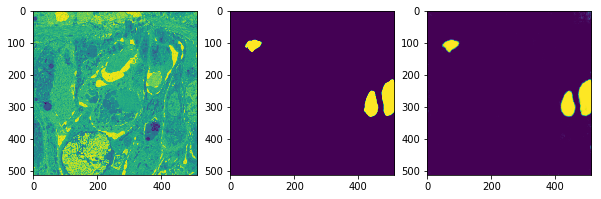

In [31]:
idx=np.random.choice(validation_data.shape[0], replace=False, size=[25])
cur_train=train_data[idx,:,:,:]
cur_truth=train_truth[idx,:,:]
results, losses=sess.run([probs, loss], feed_dict={x:cur_train, y:cur_truth, lr:lrate})

ids=4
utils.plot_3x1(cur_train[ids,:,:,0], cur_truth[ids,:,:,0], results[ids,:,:,0])

# Process new datafiles using trained network

Load the network that works best

In [23]:
saver = tf.train.Saver()
sess=tf.Session()
sess.run(tf.global_variables_initializer())

data_model=data+'v2/Model2000'
saver.restore(sess,data_model)

Function for processing a file

In [9]:
print([mean, std])

[0.6918361, 0.07028653]


In [24]:
def process_file(sess, file_name):
    file_data=utils.get_raw_float_image(file_name, [1,512,512,1])
    file_data=np.reshape(file_data, [file_data.shape[0], 512, 512, 1])
    true_test2_data=file_data[:,:,:,[0]]/655350.0
    file_data=0
    print(np.std(true_test2_data))
    print(np.mean(true_test2_data))
    
    #true_test2_data=true_test2_data/np.std(true_test2_data)*0.02
    #true_test2_data=true_test2_data-np.mean(true_test2_data)+0.55
    #v1true_test2_data=(true_test2_data-.578)/.138+0.5
    true_test2_data=(true_test2_data-.587)/.092+0.5

    print(np.std(true_test2_data))
    print(np.mean(true_test2_data))
    
    
    num_images=true_test2_data.shape[0]
    output=np.zeros([num_images,512,512,2])
    process_batch_size=20
    print('Starting')
    for t in range(0,num_images,process_batch_size):
        endrng=np.min((t+process_batch_size,num_images))
        sub_validation_data=true_test2_data[t:(t+process_batch_size), :,:,:]
        results=sess.run(probs, feed_dict={x:sub_validation_data})
        output[t:(t+process_batch_size),:,:,0]=results[:,:,:,0]
        output[t:(t+process_batch_size),:,:,1]=results[:,:,:,1]
    print('Done')
    true_test2_data=0
    true_test2_truth=0
    output=np.swapaxes(np.swapaxes(output,3,2),2,1)
    np.place(output, output<0, 0)
    (output*255.0).astype(np.uint8).tofile(file_name[0:-4]+'_output.raw')
    print(file_name[0:-4]+'_output.raw')
    return output


In [29]:
output=process_file(sess,data+'Data/Batch1.raw')

0.12998036
0.5739371
0.94189245
0.4705306


MemoryError: 

In [26]:
import glob
for f in glob.glob(data+'DataPachon/*tif.raw'):
    output=process_file(sess, f)

0.12120128
0.6280968
1.3174045
0.946703
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0197.tif_output.raw
0.12220486
0.63446665
1.3283134
1.0159438
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0228.tif_output.raw
0.09722016
0.53158027
1.0567404
-0.10237965
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0393.tif_output.raw
0.09557895
0.5191258
1.0389014
-0.23776327
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0418.tif_output.raw
0.09691518
0.5290907
1.053426
-0.12944867
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0395.tif_output.raw
0.11618681
0.63634765
1.2629004
1.036389
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0101.tif_output.raw
0.11891025
0.671198
1.2925034
1.4151951
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/F

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0377.tif_output.raw
0.10505314
0.5652253
1.1418817
0.26332185
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0328.tif_output.raw
0.11652971
0.62044984
1.2666271
0.86358404
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0150.tif_output.raw
0.12164604
0.69044757
1.3222401
1.6244298
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0003.tif_output.raw
0.12273865
0.632837
1.334116
0.9982354
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0215.tif_output.raw
0.11901544
0.61624295
1.2936465
0.81785905
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0260.tif_output.raw
0.12141105
0.63041687
1.3196864
0.9719223
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0214.tif_output.raw
0.0910227

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0467.tif_output.raw
0.108570844
0.5696523
1.180118
0.31144047
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0312.tif_output.raw
0.100916386
0.55319935
1.0969176
0.13259478
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0346.tif_output.raw
0.115760155
0.62408185
1.2582628
0.90306115
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0132.tif_output.raw
0.116279766
0.6440151
1.2639109
1.1197305
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0088.tif_output.raw
0.1188498
0.6226908
1.2918462
0.88793963
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0188.tif_output.raw
0.118354246
0.66664016
1.2864598
1.3656498
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0052.tif_output.raw
0.09

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0007.tif_output.raw
0.11091194
0.57462704
1.2055639
0.36551145
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0300.tif_output.raw
0.090166934
0.47472602
0.9800757
-0.7203845
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0500.tif_output.raw
0.09411758
0.51337874
1.023017
-0.30023098
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0435.tif_output.raw
0.12231219
0.6314689
1.3294811
0.9833562
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0247.tif_output.raw
0.107437044
0.5702826
1.1677939
0.3182853
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0318.tif_output.raw
0.091606595
0.4942352
0.995723
-0.50830615
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0466.tif_output.raw
0.12

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0089.tif_output.raw
0.103546746
0.5598233
1.1255082
0.2046023
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0332.tif_output.raw
0.12293687
0.633851
1.3362709
1.0092437
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0243.tif_output.raw
0.11743117
0.656541
1.276426
1.2558776
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0068.tif_output.raw
0.0953669
0.5195566
1.0365969
-0.23307388
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0427.tif_output.raw
0.11921291
0.6731338
1.2957927
1.436237
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0037.tif_output.raw
0.11844548
0.6242718
1.287451
0.9051329
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0179.tif_output.raw
0.116407976
0.622

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0151.tif_output.raw
0.11989558
0.6238696
1.3032126
0.9007677
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0185.tif_output.raw
0.0913287
0.48591095
0.9927032
-0.5988016
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0487.tif_output.raw
0.11601192
0.63336164
1.2609992
1.0039349
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0107.tif_output.raw
0.12208348
0.62928754
1.326994
0.95964813
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0208.tif_output.raw
0.12016877
0.681005
1.3061819
1.5218006
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0019.tif_output.raw
0.11242252
0.5832933
1.2219844
0.4597131
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0291.tif_output.raw
0.12134027
0

/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0111.tif_output.raw
0.116589986
0.62116545
1.2672825
0.87135845
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0156.tif_output.raw
0.11569591
0.62493837
1.2575645
0.91237366
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0128.tif_output.raw
0.12004142
0.68028736
1.3047985
1.5139902
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0022.tif_output.raw
0.10319079
0.5601714
1.1216381
0.20838918
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0333.tif_output.raw
0.117620334
0.6226682
1.2784815
0.88769686
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0158.tif_output.raw
0.10002701
0.54786783
1.0872501
0.07464984
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0354.tif_output.raw
0.093378

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0459.tif_output.raw
0.11827558
0.66659284
1.2856033
1.3651386
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0053.tif_output.raw
0.11628099
0.6398344
1.2639246
1.0742896
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0096.tif_output.raw
0.12272184
0.633527
1.3339331
1.0057354
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0218.tif_output.raw
0.11920724
0.62498033
1.2957312
0.91282755
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0178.tif_output.raw
0.11325213
0.5908671
1.2310015
0.5420294
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0279.tif_output.raw
0.11756855
0.61113364
1.277919
0.7623121
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0263.tif_output.raw
0.103878
0.5

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0356.tif_output.raw
0.10074753
0.5507166
1.095082
0.105613366
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0349.tif_output.raw
0.11715982
0.65369743
1.273477
1.2249688
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0071.tif_output.raw
0.11893685
0.67062306
1.2927912
1.408948
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0042.tif_output.raw
0.12288112
0.633934
1.3356647
1.0101517
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0223.tif_output.raw
0.12038057
0.6252738
1.3084843
0.91602015
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0255.tif_output.raw
0.09294462
0.49835297
1.0102671
-0.46355185
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0460.tif_output.raw
0.09117442

Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0058.tif_output.raw
0.09828284
0.5348814
1.0682912
-0.06651341
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0384.tif_output.raw
0.10092973
0.55182284
1.0970619
0.11764168
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0347.tif_output.raw
0.09117884
0.48969585
0.99107474
-0.5576503
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0481.tif_output.raw
0.121843114
0.6290103
1.3243808
0.9566273
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0201.tif_output.raw
0.119973354
0.67937046
1.304058
1.5040325
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0025.tif_output.raw
0.117056645
0.62157047
1.272355
0.87576294
Starting
Done
/n/core/micro/nro/lo2296/smc/20190225_EM_Processed/Full/DL/DataPachon/Raw0154.tif_output.raw


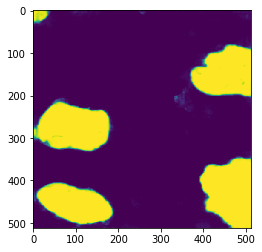

In [22]:
plt.imshow(output[10,:,:,1])